#### Christopher Kramer
#### 2021-03-1
## Classifying Stack Overflow Question Quality

# Data load & EDA

In [101]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
from bs4 import BeautifulSoup
from functools import reduce
import re
import seaborn as sns
import joblib
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, plot_confusion_matrix, accuracy_score
from tune_sklearn import TuneSearchCV, TuneGridSearchCV
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder

from sklearn.ensemble import RandomForestClassifier
from lightgbm.sklearn import LGBMClassifier
from sklearn.feature_extraction.text import TfidfVectorizer, HashingVectorizer

In [2]:
data = pd.concat([pd.read_csv('train.csv'), pd.read_csv('valid.csv')], ignore_index=True)

In [3]:
data.sample(5)

,Id,Title,Body,Tags,CreationDate,Y
21082,44276096,"My program shows an error, It says that a semi...",<pre><code>import java.util.*;\npublic class F...,<java>,2017-05-31 05:05:55,LQ_CLOSE
11745,39930103,Sending Email to SpecifiedPickupDirectory with...,<p>I was using SmtpClient till now with ASP.NE...,<c#><email><smtp><asp.net-core><mailkit>,2016-10-08 07:58:06,HQ
42805,58227991,can you explain me to how functions operate,<p>how do you use functions because i am big c...,<python>,2019-10-03 23:08:57,LQ_CLOSE
30751,49637853,Running a single line of code in PyCharm,"<p>I'm coming from RStudio, so forgive my naie...",<python><pycharm>,2018-04-03 19:33:49,HQ
29713,49143894,How Do I Encrypt and Decrypt a file from Disk ...,[enter image description here][1]::\r\n\r\nWhe...,<c++><encryption><crypto++>,2018-03-07 04:01:48,LQ_EDIT


In [4]:
data.drop(['Id'], 1, inplace=True)

In [5]:
data.columns = [c.lower() for c in data.columns]

In [6]:
data.dtypes

title           object
body            object
tags            object
creationdate    object
y               object
dtype: object

Coerce CreationDate to datetime datatype:

In [7]:
data['creationdate'] = pd.to_datetime(data['creationdate'])

The posts are HTML formatted:

In [8]:
print(BeautifulSoup(data['body'].iloc[0]).prettify())

<html>
 <body>
  <p>
   I'm already familiar with repeating tasks every n seconds by using Java.util.Timer and Java.util.TimerTask. But lets say I want to print "Hello World" to the console every random seconds from 1-5. Unfortunately I'm in a bit of a rush and don't have any code to show so far. Any help would be apriciated.
  </p>
 </body>
</html>


Since the data is mostly textual, there are not many applicable descriptive statistics at this stage.

In [9]:
data.describe()

<ipython-input-9-2bb0b18689d4>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data.describe()


,title,body,tags,creationdate,y
count,60000,60000,60000,60000,60000
unique,59995,60000,33224,59981,3
top,Regular Expression,Je suis sous symfony 4.2.11 et j'ai besoin d'e...,<python>,2016-04-27 09:59:45,HQ
freq,3,1,1068,2,20000
first,NaN,NaN,NaN,2016-01-01 00:21:59,NaN
last,NaN,NaN,NaN,2020-02-29 22:45:56,NaN


Posts range from 2016-2020, there are 60000 elements in the dataset.

In [10]:
data.isna().sum()

title           0
body            0
tags            0
creationdate    0
y               0
dtype: int64

There are no missing values.

The output variable represents the quality of the post, with the following values:

In [11]:
data['y'].unique()

array(['LQ_CLOSE', 'HQ', 'LQ_EDIT'], dtype=object)

They represent:

    - HQ: High-quality posts with a total of 30+ score and without a single edit.
    
    - LQ_EDIT: Low-quality posts with a negative score, and multiple community edits. However, they still remain open after those changes.
    
    - LQ_CLOSE: Low-quality posts that were closed by the community without a single edit.

# Feature extraction

The plan:

    1) Split the content into paragraphs
    2) Count the paragraphs
    3) Split the data into sentences
    4) Count the number of words per sentence
    5) Count unique words
    6) Check for punctuation
    7) Check for casing
    8) Clean, preprocess text
    9) Apply TFIDF
    10) Apply bag-of-words
    11) Extract POS
    12) Split tags
    13) Rationalize creation date

In [12]:
from string import punctuation
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem import WordNetLemmatizer

In [13]:
stop_words = stopwords.words('english')

In [14]:
X = data[data.columns[~data.columns.isin(['y'])]]
y = data['y']

In [15]:
def get_paragraphs(text: str) -> list:
    """
    Uses BeautifulSoup to extract paragraphs from html and returns string contents of each paragraph as a list
    """
    return [s.text for s in BeautifulSoup(text).find_all('p')]

In [16]:
data['paragraphs'] = data['body'].apply(get_paragraphs)

In [17]:
data['n_paragraphs'] = data['paragraphs'].str.len()

In [18]:
data['sentences'] = data['paragraphs'].apply(lambda x: [item for sublist in [sent_tokenize(p) for p in x] for item in sublist])

In [19]:
data['n_sentences'] = data['sentences'].str.len()

In [20]:
data.sample(5)

,title,body,tags,creationdate,y,paragraphs,n_paragraphs,sentences,n_sentences
2258,What are the platforms in the .NET Platform St...,<p>Currently trying to learn about the .NET Pl...,<c#><.net><windows><dnx><.net-core>,2016-02-16 01:06:52,HQ,[Currently trying to learn about the .NET Plat...,12,[Currently trying to learn about the .NET Plat...,24
27871,Use Tensorflow Object Detection API to detect ...,"<p>I'd like to use the Tensorflow <a href=""htt...",<tensorflow><object-detection><object-detectio...,2018-01-15 22:04:41,HQ,[I'd like to use the Tensorflow Object Detecti...,4,[I'd like to use the Tensorflow Object Detecti...,7
16775,jquery executes before html loaded,How to make the html loaded before javascript ...,<javascript><jquery>,2017-02-08 20:03:08,LQ_EDIT,[How to make the html loaded before javascript...,1,[How to make the html loaded before javascript...,2
5170,"MVC, C# - Not All Code Paths Return A Value",<p>I'm creating a basic MVC Copy File App and ...,<c#><asp.net-mvc>,2016-04-26 23:53:45,LQ_CLOSE,[I'm creating a basic MVC Copy File App and am...,1,[I'm creating a basic MVC Copy File App and am...,5
24415,VueJS 2 + ASP.NET MVC 5,<p>I'm very new with VueJS.\nI have to build a...,<asp.net><asp.net-mvc><vue.js><vuejs2><router>,2017-09-04 16:02:25,HQ,[I'm very new with VueJS.\nI have to build a s...,7,"[I'm very new with VueJS., I have to build a s...",9


In [21]:
data['paragraphs'].iloc[0][0]

'I\'m already familiar with repeating tasks every n seconds by using Java.util.Timer and Java.util.TimerTask. But lets say I want to print "Hello World" to the console every random seconds from 1-5. Unfortunately I\'m in a bit of a rush and don\'t have any code to show so far. Any help would be apriciated.  '

In [22]:
data['sentences'].iloc[0]

["I'm already familiar with repeating tasks every n seconds by using Java.util.Timer and Java.util.TimerTask.",
 'But lets say I want to print "Hello World" to the console every random seconds from 1-5.',
 "Unfortunately I'm in a bit of a rush and don't have any code to show so far.",
 'Any help would be apriciated.']

In [23]:
wnl = WordNetLemmatizer()

def get_text_parts(title: str, sentences: list) -> list:
    full_text = title + ' ' + ''.join(sentences)
    word_tokens = [wnl.lemmatize(x.lower()) for x in word_tokenize(full_text) if x not in punctuation]
    return full_text, word_tokens

def is_proper(sentences: list) -> bool:
    try:
        return sum(propers:=[1 for x in sentences if not isinstance(re.match(f'^[A-Z].*[{punctuation}]' + '{1}$', x), bool)])/len(propers) > .75
    except ZeroDivisionError:
        return False

In [24]:
data[['full_text', 'word_tokens']] = pd.DataFrame(data.apply(lambda x: get_text_parts(x['title'], x['sentences']), 1).to_list(), index=data.index)

In [25]:
data.sample(3)

,title,body,tags,creationdate,y,paragraphs,n_paragraphs,sentences,n_sentences,full_text,word_tokens
59542,"I'm getting the error ""Result of comparison ag...",<p>I'm new to C so I found it weird when I saw...,<c>,2019-11-29 00:57:04,LQ_CLOSE,[I'm new to C so I found it weird when I saw t...,2,[I'm new to C so I found it weird when I saw t...,3,"I'm getting the error ""Result of comparison ag...","[i, 'm, getting, the, error, ``, result, of, c..."
13129,returning from method when spawned thread is r...,I am new to thread related concepts.I have pro...,<c++><multithreading><boost>,2016-11-09 17:02:29,LQ_EDIT,[I am new to thread related concepts.I have pr...,1,[I am new to thread related concepts.I have pr...,4,returning from method when spawned thread is r...,"[returning, from, method, when, spawned, threa..."
31853,Angular 5 to 6 Upgrade: Property 'map' does no...,<p>Ive upgraded my angular application from ve...,<angular><rxjs>,2018-05-06 18:37:10,HQ,[Ive upgraded my angular application from vers...,2,[Ive upgraded my angular application from vers...,2,Angular 5 to 6 Upgrade: Property 'map' does no...,"[angular, 5, to, 6, upgrade, property, 'map, d..."


In [26]:
data['is_proper'] = data['sentences'].apply(is_proper)

In [27]:
data[data['is_proper'] == False]

,title,body,tags,creationdate,y,paragraphs,n_paragraphs,sentences,n_sentences,full_text,word_tokens,is_proper
710,how can i display first 3list data instead of ...,<ul>\r\n<li>Karnataka</li>\r\n<li>Assam</li>\r...,<html><css>,2016-01-16 06:50:11,LQ_EDIT,[],0,[],0,how can i display first 3list data instead of ...,"[how, can, i, display, first, 3list, data, ins...",False
863,"I need to find a xpath, so that I can click on...","<button id=""79436c61930112002b29d457b47ffb...",<html><selenium><xpath>,2016-01-19 01:53:02,LQ_EDIT,[],0,[],0,"I need to find a xpath, so that I can click on...","[i, need, to, find, a, xpath, so, that, i, can...",False
888,How can this be done in perl,"<Root>\r\n <Top Name="" "">\r\n ...",<xml><perl><foreach>,2016-01-19 13:38:44,LQ_EDIT,[],0,[],0,How can this be done in perl,"[how, can, this, be, done, in, perl]",False
1291,I want a div to show only when user clicks on ...,"<form id=""search"" action=""#"" method=""post""...",<javascript><jquery><html><css>,2016-01-28 10:55:30,LQ_EDIT,[],0,[],0,I want a div to show only when user clicks on ...,"[i, want, a, div, to, show, only, when, user, ...",False
1978,How to have a file or string available to mult...,<br>\r\nI have a bit of an issue/question. <br...,<c#><serialization>,2016-02-09 20:11:01,LQ_EDIT,[],0,[],0,How to have a file or string available to mult...,"[how, to, have, a, file, or, string, available...",False
...,...,...,...,...,...,...,...,...,...,...,...,...
57674,I am getting unexpected token error from my code,<script>\r\n\r\n function delete(n){\r\n\r\n ...,<javascript>,2019-01-18 01:13:08,LQ_EDIT,[],0,[],0,I am getting unexpected token error from my code,"[i, am, getting, unexpected, token, error, fro...",False
57981,what is my error ? (first number is 1 and seco...,"<pre><code>num1 = input(""First number : "")\nnu...",<python><python-3.x><python-2.7><python-requests>,2019-03-05 09:55:00,LQ_CLOSE,[],0,[],0,what is my error ? (first number is 1 and seco...,"[what, is, my, error, first, number, is, 1, an...",False
58063,i am using ng-hide in angular but it's not wor...,"<nav class=""menu-nav"">\r\n <ul>\r\n...",<angularjs><typescript>,2019-03-16 07:40:26,LQ_EDIT,[],0,[],0,i am using ng-hide in angular but it's not wor...,"[i, am, using, ng-hide, in, angular, but, it, ...",False
59210,US currency Format,"<input type=""text"" class=""form-control"" id=""cu...",<javascript>,2019-09-25 16:45:52,LQ_EDIT,[],0,[],0,US currency Format,"[u, currency, format]",False


Dropping samples where text was not successfully parsed.

In [28]:
data = data[data['n_sentences'] > 0]

In [29]:
data[data['is_proper'] == False]

,title,body,tags,creationdate,y,paragraphs,n_paragraphs,sentences,n_sentences,full_text,word_tokens,is_proper


It appears that checking for proper capitalization and punctuation is not useful, this feature will be dropped.

In [30]:
data = data.drop(['is_proper'], 1)

In [31]:
data

,title,body,tags,creationdate,y,paragraphs,n_paragraphs,sentences,n_sentences,full_text,word_tokens
0,Java: Repeat Task Every Random Seconds,<p>I'm already familiar with repeating tasks e...,<java><repeat>,2016-01-01 00:21:59,LQ_CLOSE,[I'm already familiar with repeating tasks eve...,1,[I'm already familiar with repeating tasks eve...,4,Java: Repeat Task Every Random Seconds I'm alr...,"[java, repeat, task, every, random, second, i,..."
1,Why are Java Optionals immutable?,<p>I'd like to understand why Java 8 Optionals...,<java><optional>,2016-01-01 02:03:20,HQ,[I'd like to understand why Java 8 Optionals w...,1,[I'd like to understand why Java 8 Optionals w...,2,Why are Java Optionals immutable? I'd like to ...,"[why, are, java, optionals, immutable, i, 'd, ..."
2,Text Overlay Image with Darkened Opacity React...,<p>I am attempting to overlay a title over an ...,<javascript><image><overlay><react-native><opa...,2016-01-01 02:48:24,HQ,[I am attempting to overlay a title over an im...,3,[I am attempting to overlay a title over an im...,5,Text Overlay Image with Darkened Opacity React...,"[text, overlay, image, with, darkened, opacity..."
3,Why ternary operator in swift is so picky?,"<p>The question is very simple, but I just cou...",<swift><operators><whitespace><ternary-operato...,2016-01-01 03:30:17,HQ,"[The question is very simple, but I just could...",8,"[The question is very simple, but I just could...",11,Why ternary operator in swift is so picky? The...,"[why, ternary, operator, in, swift, is, so, pi..."
4,hide/show fab with scale animation,<p>I'm using custom floatingactionmenu. I need...,<android><material-design><floating-action-but...,2016-01-01 05:21:48,HQ,[I'm using custom floatingactionmenu. I need t...,2,"[I'm using custom floatingactionmenu., I need ...",3,hide/show fab with scale animation I'm using c...,"[hide/show, fab, with, scale, animation, i, 'm..."
...,...,...,...,...,...,...,...,...,...,...,...
59995,How can I align two flex boxes to follow each ...,"<p>I have a menu, and I'd like the div.right-c...",<html><css><flexbox>,2020-02-29 13:32:56,LQ_CLOSE,"[I have a menu, and I'd like the div.right-con...",6,"[I have a menu, and I'd like the div.right-con...",4,How can I align two flex boxes to follow each ...,"[how, can, i, align, two, flex, box, to, follo..."
59996,C++ The correct way to multiply an integer and...,<p>I try to multiply an integer by a double bu...,<c++>,2020-02-29 17:46:41,LQ_CLOSE,[I try to multiply an integer by a double but ...,2,[I try to multiply an integer by a double but ...,5,C++ The correct way to multiply an integer and...,"[c++, the, correct, way, to, multiply, an, int..."
59997,WHY DJANGO IS SHOWING ME THIS ERROR WHEN I TRY...,*URLS.PY*\r\n //URLS.PY FILE\r\n fro...,<django><django-views><django-templates>,2020-02-29 18:35:39,LQ_EDIT,[*URLS.PY*\r\n //URLS.PY FILE\r\n from d...,1,[*URLS.PY*\r\n //URLS.PY FILE\r\n from d...,2,WHY DJANGO IS SHOWING ME THIS ERROR WHEN I TRY...,"[why, django, is, showing, me, this, error, wh..."
59998,PHP - getting the content of php page,<p>I have a controller inside which a server i...,<javascript><php><html>,2020-02-29 20:32:14,LQ_CLOSE,[I have a controller inside which a server is ...,2,[I have a controller inside which a server is ...,3,PHP - getting the content of php page I have a...,"[php, getting, the, content, of, php, page, i,..."


In [32]:
data['tags'] = data['tags'].apply(lambda x: re.sub("^<(.*)>$","\g<1>", x).split("><"))

In [33]:
all_tags = set([item for sublist in data['tags'].to_list() for item in sublist])

In [34]:
len(all_tags)

10696

In [35]:
mapping = {v: k for k, v in enumerate(all_tags)}

In [36]:
max(data['tags'].str.len())

6

In [37]:
def expand_tags(tags: list) -> list:
    return [mapping[x] + 1 for x in tags] + ([0] * (6 - len(tags)))

In [38]:
tag_cols = [f'tag_{x}' for x in range(6)]

In [39]:
data[tag_cols] = pd.DataFrame(data["tags"].apply(expand_tags).to_list(), index=data.index)

In [40]:
for i in tag_cols:
    data[i] = data[i].astype(int)

In [41]:
data = data.drop(['tags'], 1)

In [42]:
data.sample(3)

,title,body,creationdate,y,paragraphs,n_paragraphs,sentences,n_sentences,full_text,word_tokens,tag_0,tag_1,tag_2,tag_3,tag_4,tag_5
45012,Form Validation project,<p>I am working on a project for my company an...,2016-01-02 03:06:08,LQ_CLOSE,[I am working on a project for my company and ...,1,[I am working on a project for my company and ...,6,Form Validation project I am working on a proj...,"[form, validation, project, i, am, working, on...",2219,10245,10572,0,0,0
30572,Why does it show value 5150 and not 155?,<p>So im quite new to javascript and i tried m...,2018-03-29 23:21:56,LQ_CLOSE,[So im quite new to javascript and i tried mak...,3,[So im quite new to javascript and i tried mak...,4,Why does it show value 5150 and not 155? So im...,"[why, doe, it, show, value, 5150, and, not, 15...",2219,0,0,0,0,0
8407,php pdo sql constraint violation,"Good morning,\r\ni have a big problem with thi...",2016-07-25 05:09:45,LQ_EDIT,"[Good morning,\r\ni have a big problem with th...",1,"[Good morning,\r\ni have a big problem with th...",1,"php pdo sql constraint violation Good morning,...","[php, pdo, sql, constraint, violation, good, m...",4777,9703,3112,6598,0,0


### Engineering date/times

In [43]:
data['time_of_day'] = data['creationdate'].dt.hour

In [44]:
data['day_of_month'] = data['creationdate'].dt.day

In [45]:
data['month'] = data['creationdate'].dt.month

A sinusoidal/cosine transformation will be used to encode the time features, to capture that hour 24 is as close to hour 23 as it is to hour 1, etc.

In [46]:
data['hour_sin'] = np.sin(2 * np.pi * data['time_of_day']/23.0)
data['hour_cos'] = np.cos(2 * np.pi * data['time_of_day']/23.0)

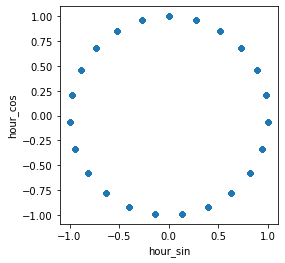

In [47]:
ax = data.plot.scatter('hour_sin', 'hour_cos').set_aspect('equal')

In [48]:
data['day_sin'] = np.sin(2 * np.pi * data['day_of_month']/30)
data['day_cos'] = np.cos(2 * np.pi * data['day_of_month']/30)

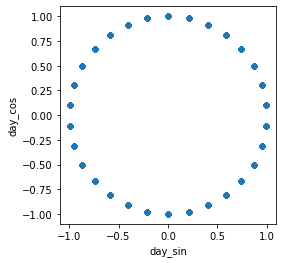

In [49]:
ax = data.plot.scatter('day_sin', 'day_cos').set_aspect('equal')

In [50]:
data['month_sin'] = np.sin(2 * np.pi * data['month']/11)
data['month_cos'] = np.cos(2 * np.pi * data['month']/11)

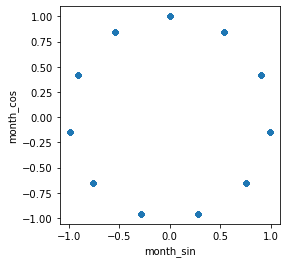

In [51]:
ax = data.plot.scatter('month_sin', 'month_cos').set_aspect('equal')

In [52]:
data = data.drop(['title', 'body', 'creationdate', 'paragraphs', 'sentences', 'time_of_day', 'day_of_month', 'month'], 1)

In [53]:
data.to_parquet('data.pq')

In [54]:
data = pd.read_parquet('data.pq')

### Engineering text

In [55]:
tfidf = TfidfVectorizer(strip_accents='ascii', stop_words='english')

In [56]:
tfidf.fit_transform(data['full_text'])

<59880x157914 sparse matrix of type '<class 'numpy.float64'>'
	with 1862767 stored elements in Compressed Sparse Row format>

In [57]:
pd.DataFrame(tfidf.idf_, index=tfidf.get_feature_names(), columns=['idf_weight']).sort_values(['idf_weight'])

,idf_weight
code,2.276232
using,2.330958
want,2.389590
like,2.424645
use,2.680382
...,...
execp,11.306967
execnonquery,11.306967
execneo,11.306967
exectuteupdate,11.306967


Some of the least unique words are "code", "using", "want", where the most unique appear to be typos.

In [58]:
hv = HashingVectorizer(strip_accents='ascii', stop_words='english')

In [59]:
hv.fit_transform(data['full_text'])

<59880x1048576 sparse matrix of type '<class 'numpy.float64'>'
	with 1862734 stored elements in Compressed Sparse Row format>

### Profiling

In [60]:
temp_data = data.copy()

In [61]:
temp_data['y'] = temp_data['y'].astype('category').cat.codes

In [62]:
temp_data.drop(['full_text', 'word_tokens'], 1, inplace=True)

In [63]:
ProfileReport(temp_data)

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

There are not many interactions amongst the features. The number of paragraphs has the strongest correlation with the target variable. Since categorically y is inverse (lower integer = better post), it makes sense that there is an inverse relationship here.

Since so few rows have more than 4 tags, the extra features will be dropped.

In [64]:
data = data.drop(['tag_4', 'tag_5'], 1)

### Engineering tags

In [65]:
tags = [i for x in data[tag_cols[:3]].values.tolist() for i in x]

<AxesSubplot:ylabel='Count'>

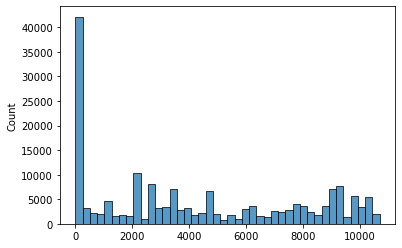

In [66]:
sns.histplot(tags)

### Building pipelines

In [67]:
tfidf_ct = make_column_transformer((OneHotEncoder(handle_unknown='ignore'), tag_cols[:3]), (tfidf, 'full_text'))
hv_ct = make_column_transformer((OneHotEncoder(handle_unknown='ignore'), tag_cols[:3]), (hv, 'full_text'))

In [68]:
rf_hv_pipe = make_pipeline(hv_ct, RandomForestClassifier(verbose=1, n_jobs=15))
lgbm_hv_pipe = make_pipeline(hv_ct, LGBMClassifier(verbose=1, n_jobs=15))
rf_tfidf_pipe = make_pipeline(tfidf_ct, RandomForestClassifier(verbose=1, n_jobs=15))
lgbm_tfidf_pipe = make_pipeline(tfidf_ct, LGBMClassifier(verbose=1, n_jobs=15))

### Model training

In [69]:
X = data[data.columns[~data.columns.isin(['y'])]]
y = data['y']

In [70]:
X = X.drop(['word_tokens'], 1)

In [71]:
X_train, X_test, y_train, y_test = train_test_split(X, y)

In [72]:
for m in [rf_hv_pipe, lgbm_hv_pipe, rf_tfidf_pipe, lgbm_tfidf_pipe]:
    print(f'Fitting {str(m)}')
    m.fit(X_train, y_train)

Fitting Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['tag_0', 'tag_1', 'tag_2']),
                                                 ('hashingvectorizer',
                                                  HashingVectorizer(stop_words='english',
                                                                    strip_accents='ascii'),
                                                  'full_text')])),
                ('randomforestclassifier',
                 RandomForestClassifier(n_jobs=15, verbose=1))])


[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  20 tasks      | elapsed:  2.2min
[Parallel(n_jobs=15)]: Done 100 out of 100 | elapsed:  7.4min finished


Fitting Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['tag_0', 'tag_1', 'tag_2']),
                                                 ('hashingvectorizer',
                                                  HashingVectorizer(stop_words='english',
                                                                    strip_accents='ascii'),
                                                  'full_text')])),
                ('lgbmclassifier', LGBMClassifier(n_jobs=15, verbose=1))])
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.282038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 269315
[LightGBM] [Info] Number of data points in the train set:

[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  20 tasks      | elapsed:    9.8s
[Parallel(n_jobs=15)]: Done 100 out of 100 | elapsed:   33.0s finished


Fitting Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['tag_0', 'tag_1', 'tag_2']),
                                                 ('tfidfvectorizer',
                                                  TfidfVectorizer(stop_words='english',
                                                                  strip_accents='ascii'),
                                                  'full_text')])),
                ('lgbmclassifier', LGBMClassifier(n_jobs=15, verbose=1))])
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.227531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 278425
[LightGBM] [Info] Number of data points in the train set: 44910, number of used features: 6089
[LightGBM] [Info] Start training

In [73]:
joblib.dump(rf_hv_pipe, 'rf_hv_pipe.jl')
joblib.dump(lgbm_hv_pipe, 'lgbm_hv_pipe.jl')
joblib.dump(rf_tfidf_pipe, 'rf_tfidf_pipe.jl')
joblib.dump(lgbm_tfidf_pipe, 'lgbm_tfidf_pipe.jl')

['lgbm_tfidf_pipe.jl']

### Model evaluation

In [74]:
rf_hv_pipe.predict(X_test)

[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=15)]: Done 100 out of 100 | elapsed:    0.8s finished


array(['LQ_CLOSE', 'HQ', 'LQ_EDIT', ..., 'LQ_CLOSE', 'LQ_CLOSE',
       'LQ_EDIT'], dtype=object)

In [103]:
models = ["Random Forest with HashingVec", "LGBM with Hashing Vec", "Random Forest with TFIDF", "LGBM with TFIDF"]
for i, m in enumerate([rf_hv_pipe, lgbm_hv_pipe, rf_tfidf_pipe, lgbm_tfidf_pipe]):
    print(f'{models[i]}')
    print(classification_report(y_test, m.predict(X_test)))
    print(f'Accuracy: {accuracy_score(y_test, m.predict(X_test)): .2f}')
    print(''.join(['-'] * 50))

Random Forest with HashingVec


[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=15)]: Done 100 out of 100 | elapsed:    0.8s finished


              precision    recall  f1-score   support

          HQ       0.80      0.77      0.78      5010
    LQ_CLOSE       0.60      0.84      0.70      4980
     LQ_EDIT       0.90      0.57      0.70      4980

    accuracy                           0.73     14970
   macro avg       0.77      0.73      0.73     14970
weighted avg       0.77      0.73      0.73     14970



[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=15)]: Done 100 out of 100 | elapsed:    0.8s finished


Accuracy:  0.73
--------------------------------------------------
LGBM with Hashing Vec
              precision    recall  f1-score   support

          HQ       0.79      0.82      0.80      5010
    LQ_CLOSE       0.67      0.74      0.71      4980
     LQ_EDIT       0.81      0.68      0.74      4980

    accuracy                           0.75     14970
   macro avg       0.76      0.75      0.75     14970
weighted avg       0.76      0.75      0.75     14970

Accuracy:  0.75
--------------------------------------------------
Random Forest with TFIDF


[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=15)]: Done 100 out of 100 | elapsed:    0.2s finished


              precision    recall  f1-score   support

          HQ       0.79      0.80      0.79      5010
    LQ_CLOSE       0.62      0.82      0.71      4980
     LQ_EDIT       0.89      0.59      0.71      4980

    accuracy                           0.74     14970
   macro avg       0.77      0.74      0.74     14970
weighted avg       0.77      0.74      0.74     14970



[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=15)]: Done 100 out of 100 | elapsed:    0.2s finished


Accuracy:  0.74
--------------------------------------------------
LGBM with TFIDF
              precision    recall  f1-score   support

          HQ       0.79      0.83      0.81      5010
    LQ_CLOSE       0.66      0.76      0.71      4980
     LQ_EDIT       0.82      0.67      0.74      4980

    accuracy                           0.75     14970
   macro avg       0.76      0.75      0.75     14970
weighted avg       0.76      0.75      0.75     14970

Accuracy:  0.75
--------------------------------------------------


The TFIDF version of the model slightly outperforms the HashingVectorizer in both classifiers. The LGBM slightly outperforms RandomForest overall.

Overfitting on Random Forest:

In [106]:
print(classification_report(y_train, rf_tfidf_pipe.predict(X_train)))
print(f'Accuracy: {accuracy_score(y_train, rf_tfidf_pipe.predict(X_train)): .2f}')

[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  20 tasks      | elapsed:    0.2s
[Parallel(n_jobs=15)]: Done 100 out of 100 | elapsed:    0.9s finished


              precision    recall  f1-score   support

          HQ       1.00      1.00      1.00     14983
    LQ_CLOSE       1.00      1.00      1.00     15004
     LQ_EDIT       1.00      1.00      1.00     14923

    accuracy                           1.00     44910
   macro avg       1.00      1.00      1.00     44910
weighted avg       1.00      1.00      1.00     44910



[Parallel(n_jobs=15)]: Using backend ThreadingBackend with 15 concurrent workers.
[Parallel(n_jobs=15)]: Done  20 tasks      | elapsed:    0.2s


Accuracy:  1.00


[Parallel(n_jobs=15)]: Done 100 out of 100 | elapsed:    0.8s finished


Overfitting on LGBM:

In [107]:
print(classification_report(y_train, lgbm_tfidf_pipe.predict(X_train)))
print(f'Accuracy: {accuracy_score(y_train, lgbm_tfidf_pipe.predict(X_train)): .2f}')

              precision    recall  f1-score   support

          HQ       0.83      0.87      0.85     14983
    LQ_CLOSE       0.74      0.80      0.77     15004
     LQ_EDIT       0.86      0.74      0.80     14923

    accuracy                           0.80     44910
   macro avg       0.81      0.80      0.80     44910
weighted avg       0.81      0.80      0.80     44910

Accuracy:  0.80


While training scores are not as good on the LGBM model, it is substantially less overfit and will be used for further analysis.

### Preprocessor prelim tuning

Due to memory issues, the vectorizer and model are tuned separately.

In [80]:
tfidf_params = {
    'columntransformer__tfidfvectorizer__ngram_range' : [(1, 1), (1, 2), (1, 3)],
    'columntransformer__tfidfvectorizer__max_df' : [1, 5, 10, 15],
}

In [81]:
hv_params = {
    'columntransformer__hashingvectorizer__ngram_range' : [(1, 1), (1, 2), (1, 3)],
}

In [82]:
tfidf_cv_prelim = TuneGridSearchCV(lgbm_tfidf_pipe, tfidf_params, cv=4, early_stopping=True, verbose=1, use_gpu = True, loggers=[], max_iters = 5, n_jobs=-1)

c:\users\kitthekat\appdata\local\programs\python\python38\lib\site-packages\tune_sklearn\tune_basesearch.py:439: UserWarning: tune-sklearn implements incremental learning for lightgbm models following this: https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMModel.html#lightgbm.LGBMModel.fit This may negatively impact performance. To disable, set `early_stopping=False`.
  warnings.warn(


In [83]:
tfidf_cv_prelim.fit(X_train, y_train)

(pid=35236) Windows fatal exception: access violation
(pid=35236) 


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1186
[LightGBM] [Info] Number of data points in the train set: 44910, number of used features: 593
[LightGBM] [Info] Start training from score -1.097744
[LightGBM] [Info] Start training from score -1.096344
[LightGBM] [Info] Start training from score -1.101757


TuneGridSearchCV(cv=4,
                 early_stopping=<ray.tune.schedulers.async_hyperband.AsyncHyperBandScheduler object at 0x0000027129F37730>,
                 estimator=Pipeline(steps=[('columntransformer',
                                            ColumnTransformer(transformers=[('onehotencoder',
                                                                             OneHotEncoder(handle_unknown='ignore'),
                                                                             ['tag_0',
                                                                              'tag_1',
                                                                              'tag_2']),
                                                                            ('tfidfvectorizer',
                                                                             TfidfVectorizer(stop_words='english',
                                                                                             strip_a...

In [84]:
joblib.dump(tfidf_cv_prelim, 'tfidf_cv_prelim.jl')

['tfidf_cv_prelim.jl']

In [85]:
tfidf_cv_prelim.best_params_

{'columntransformer__tfidfvectorizer__ngram_range': (1, 1),
 'columntransformer__tfidfvectorizer__max_df': 1}

In [108]:
print(classification_report(y_test, tfidf_cv_prelim.best_estimator_.predict(X_test)))
print(f'Accuracy: {accuracy_score(y_test, tfidf_cv_prelim.best_estimator_.predict(X_test)): .2f}')

              precision    recall  f1-score   support

          HQ       0.68      0.77      0.72      5010
    LQ_CLOSE       0.52      0.63      0.57      4980
     LQ_EDIT       0.56      0.36      0.43      4980

    accuracy                           0.59     14970
   macro avg       0.58      0.59      0.58     14970
weighted avg       0.58      0.59      0.58     14970

Accuracy:  0.59


In [87]:
hv_cv_prelim = TuneGridSearchCV(lgbm_hv_pipe, hv_params, cv=4, early_stopping=True, verbose=1, use_gpu = True, loggers=[], max_iters = 4, n_jobs=-1)

c:\users\kitthekat\appdata\local\programs\python\python38\lib\site-packages\tune_sklearn\tune_basesearch.py:439: UserWarning: tune-sklearn implements incremental learning for lightgbm models following this: https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMModel.html#lightgbm.LGBMModel.fit This may negatively impact performance. To disable, set `early_stopping=False`.
  warnings.warn(


In [88]:
hv_cv_prelim.fit(X_train, y_train)

(pid=39200) Windows fatal exception: access violation
(pid=39200) 
(pid=39200) Windows fatal exception: access violation
(pid=39200) 


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.476259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 376870
[LightGBM] [Info] Number of data points in the train set: 44910, number of used features: 12371
[LightGBM] [Info] Start training from score -1.097744
[LightGBM] [Info] Start training from score -1.096344
[LightGBM] [Info] Start training from score -1.101757


TuneGridSearchCV(cv=4,
                 early_stopping=<ray.tune.schedulers.async_hyperband.AsyncHyperBandScheduler object at 0x0000027129D18340>,
                 estimator=Pipeline(steps=[('columntransformer',
                                            ColumnTransformer(transformers=[('onehotencoder',
                                                                             OneHotEncoder(handle_unknown='ignore'),
                                                                             ['tag_0',
                                                                              'tag_1',
                                                                              'tag_2']),
                                                                            ('hashingvectorizer',
                                                                             HashingVectorizer(stop_words='english',
                                                                                               str.

In [89]:
joblib.dump(hv_cv_prelim, 'hv_cv_prelim.jl')

['hv_cv_prelim.jl']

In [90]:
hv_cv_prelim.best_params_

{'columntransformer__hashingvectorizer__ngram_range': (1, 2)}

In [109]:
print(classification_report(y_test, hv_cv_prelim.best_estimator_.predict(X_test)))
print(f'Accuracy: {accuracy_score(y_test, hv_cv_prelim.best_estimator_.predict(X_test)): .2f}')

              precision    recall  f1-score   support

          HQ       0.79      0.83      0.81      5010
    LQ_CLOSE       0.68      0.74      0.71      4980
     LQ_EDIT       0.81      0.68      0.74      4980

    accuracy                           0.75     14970
   macro avg       0.76      0.75      0.75     14970
weighted avg       0.76      0.75      0.75     14970

Accuracy:  0.75


### Model hyperparameter tuning

#### Prelim model

In [95]:
params = {
    'lgbmclassifier__num_leaves': [10, 31, 40, 51], # 31 is default,
    'lgbmclassifier__learning_rate': [.01, .1, 1],
    'lgbmclassifier__n_estimators' : [5, 40, 70, 100, 200]
}

In [96]:
model_cv_prelim = TuneSearchCV(hv_cv_prelim.best_estimator_, 
                               params, 
                               cv=4, 
                               early_stopping=True, 
                               verbose=1, 
                               use_gpu = True, 
                               loggers=[], 
                               max_iters = 5, 
                               n_jobs=-1, 
                               search_optimization="random")

In [97]:
model_cv_prelim.fit(X_train, y_train)

(pid=16320) Windows fatal exception: access violation
(pid=16320) 
(pid=16320) Windows fatal exception: access violation
(pid=16320) 
(pid=16320) Windows fatal exception: access violation
(pid=16320) 


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.507228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 376870
[LightGBM] [Info] Number of data points in the train set: 44910, number of used features: 12371
[LightGBM] [Info] Start training from score -1.097744
[LightGBM] [Info] Start training from score -1.096344
[LightGBM] [Info] Start training from score -1.101757


TuneSearchCV(cv=4,
             early_stopping=<ray.tune.schedulers.async_hyperband.AsyncHyperBandScheduler object at 0x00000270F7501220>,
             estimator=Pipeline(steps=[('columntransformer',
                                        ColumnTransformer(transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore'),
                                                                         ['tag_0',
                                                                          'tag_1',
                                                                          'tag_2']),
                                                                        ('hashingvectorizer',
                                                                         HashingVectorizer(ngram_range=(1,
                                                                                                        2),
                                     

In [98]:
joblib.dump(model_cv_prelim, 'model_cv_prelim.jl')

['model_cv_prelim.jl']

In [3]:
with open('model_cv_prelim.jl', 'rb') as fp:
    model_cv_prelim = joblib.load(fp)

In [99]:
model_cv_prelim.best_params_

{'lgbmclassifier__num_leaves': 51,
 'lgbmclassifier__learning_rate': 0.1,
 'lgbmclassifier__n_estimators': 40}

In [110]:
print(classification_report(y_test, model_cv_prelim.best_estimator_.predict(X_test)))
print(f'Accuracy: {accuracy_score(y_test, model_cv_prelim.best_estimator_.predict(X_test)): .2f}')

              precision    recall  f1-score   support

          HQ       0.76      0.81      0.79      5010
    LQ_CLOSE       0.66      0.74      0.69      4980
     LQ_EDIT       0.81      0.65      0.72      4980

    accuracy                           0.73     14970
   macro avg       0.74      0.73      0.73     14970
weighted avg       0.74      0.73      0.73     14970

Accuracy:  0.73


#### Model hyperparameter refinement

In [16]:
params = {
    'lgbmclassifier__num_leaves': [45, 50, 51, 52, 53, 60], 
    'lgbmclassifier__learning_rate': [.09, .1, .11, .12, .2],
    'lgbmclassifier__n_estimators' : [35, 40, 45]
}

In [17]:
model_cv = TuneSearchCV(lgbm_tfidf_pipe, params, cv=4, early_stopping=True, verbose=1, use_gpu = True, loggers=[], max_iters = 5, n_jobs=-1, search_optimization="random")

c:\users\kitthekat\appdata\local\programs\python\python38\lib\site-packages\tune_sklearn\tune_basesearch.py:439: UserWarning: tune-sklearn implements incremental learning for lightgbm models following this: https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMModel.html#lightgbm.LGBMModel.fit This may negatively impact performance. To disable, set `early_stopping=False`.
  warnings.warn(


In [22]:
model_cv.fit(X_train, y_train)

(pid=32296) Windows fatal exception: access violation
(pid=32296) 


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.242312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 279211
[LightGBM] [Info] Number of data points in the train set: 44910, number of used features: 6134
[LightGBM] [Info] Start training from score -1.093947
[LightGBM] [Info] Start training from score -1.098746
[LightGBM] [Info] Start training from score -1.103165


TuneSearchCV(cv=4,
             early_stopping=<ray.tune.schedulers.async_hyperband.AsyncHyperBandScheduler object at 0x000001D9D629B820>,
             estimator=Pipeline(steps=[('columntransformer',
                                        ColumnTransformer(transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore'),
                                                                         ['tag_0',
                                                                          'tag_1',
                                                                          'tag_2']),
                                                                        ('tfidfvectorizer',
                                                                         TfidfVectorizer(stop_words='english',
                                                                                         strip_accen...
             loggers=[<class 'ray.tune.

In [23]:
joblib.dump(model_cv, 'model_cv.jl')

['model_cv.jl']

In [24]:
model_cv.best_params_

{'lgbmclassifier__num_leaves': 50,
 'lgbmclassifier__learning_rate': 0.12,
 'lgbmclassifier__n_estimators': 45}

In [37]:
model_cv.cv_results_

{'params': [{'lgbmclassifier__num_leaves': 53,
   'lgbmclassifier__learning_rate': 0.1,
   'lgbmclassifier__n_estimators': 40},
  {'lgbmclassifier__num_leaves': 51,
   'lgbmclassifier__learning_rate': 0.2,
   'lgbmclassifier__n_estimators': 45},
  {'lgbmclassifier__num_leaves': 45,
   'lgbmclassifier__learning_rate': 0.1,
   'lgbmclassifier__n_estimators': 40},
  {'lgbmclassifier__num_leaves': 52,
   'lgbmclassifier__learning_rate': 0.1,
   'lgbmclassifier__n_estimators': 45},
  {'lgbmclassifier__num_leaves': 50,
   'lgbmclassifier__learning_rate': 0.11,
   'lgbmclassifier__n_estimators': 45},
  {'lgbmclassifier__num_leaves': 50,
   'lgbmclassifier__learning_rate': 0.12,
   'lgbmclassifier__n_estimators': 45},
  {'lgbmclassifier__num_leaves': 50,
   'lgbmclassifier__learning_rate': 0.1,
   'lgbmclassifier__n_estimators': 45},
  {'lgbmclassifier__num_leaves': 53,
   'lgbmclassifier__learning_rate': 0.11,
   'lgbmclassifier__n_estimators': 35},
  {'lgbmclassifier__num_leaves': 45,
   'lg

In [46]:
tfidf_ct = make_column_transformer((OneHotEncoder(handle_unknown='ignore'), tag_cols[:3]), (tfidf, 'full_text'))

In [47]:
new_model = make_pipeline(tfidf_ct, LGBMClassifier(num_leaves=50, learning_rate=.12, n_estimators=45, verbose=0, n_jobs=15))

In [48]:
new_model.fit(X_train, y_train)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.289181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.


Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['tag_0', 'tag_1', 'tag_2']),
                                                 ('tfidfvectorizer',
                                                  TfidfVectorizer(stop_words='english',
                                                                  strip_accents='ascii'),
                                                  'full_text')])),
                ('lgbmclassifier',
                 LGBMClassifier(learning_rate=0.12, n_estimators=45, n_jobs=15,
                                num_leaves=50, verbose=0))])

#### Evaluate

In [49]:
print(classification_report(y_test, new_model.predict(X_test)))

              precision    recall  f1-score   support

          HQ       0.77      0.83      0.80      4953
    LQ_CLOSE       0.67      0.76      0.71      5016
     LQ_EDIT       0.82      0.66      0.73      5001

    accuracy                           0.75     14970
   macro avg       0.76      0.75      0.75     14970
weighted avg       0.76      0.75      0.75     14970



There is negligible difference with model tuning

Unfortunately, tuning does not yield significant improvements, and decreases the performance of the TFIDF preprocessor over default parameters.